In [5]:
import youtube_dl
import librosa
import ipympl
import matplotlib.pyplot as plt
import librosa
import librosa.display
import IPython.display as ipd
import numpy as np
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
ydl_opts = {
    'format': 'bestaudio/best',
    'postprocessors': [{
    'key': 'FFmpegExtractAudio',
    'preferredcodec': 'wav',
    'preferredquality': '320',
    }],
}

In [4]:
with youtube_dl.YoutubeDL(ydl_opts) as ydl:
    ydl.download(['https://www.youtube.com/watch?v=-ZvsGmYKhcU'])

[youtube] -ZvsGmYKhcU: Downloading webpage
[download] Destination: Coldplay - Viva La Vida (Live In São Paulo)--ZvsGmYKhcU.m4a
[download] 100% of 3.82MiB in 01:22                 
[ffmpeg] Correcting container in "Coldplay - Viva La Vida (Live In São Paulo)--ZvsGmYKhcU.m4a"
[ffmpeg] Destination: Coldplay - Viva La Vida (Live In São Paulo)--ZvsGmYKhcU.wav
Deleting original file Coldplay - Viva La Vida (Live In São Paulo)--ZvsGmYKhcU.m4a (pass -k to keep)


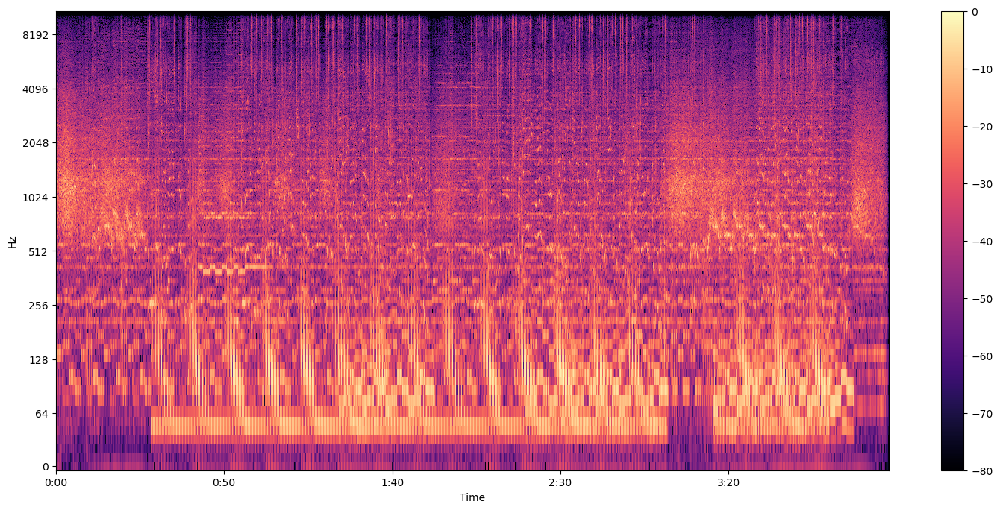

In [6]:
y, sr = librosa.load("Coldplay - Viva La Vida (Live In São Paulo)--ZvsGmYKhcU.wav")
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
plt.figure(figsize=(18,8))
librosa.display.specshow(D, y_axis='log', x_axis='time',sr=sr)
plt.colorbar()

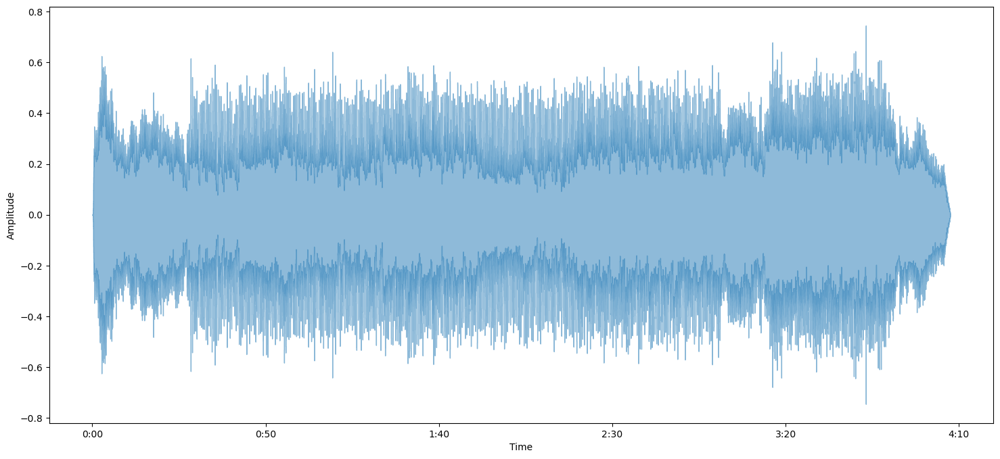

In [7]:
plt.figure(figsize=(18,8))
plt.xlabel('Time')
plt.ylabel('Amplitude')
librosa.display.waveshow(y, alpha=0.5)

In [9]:
ipd.display(ipd.Audio(y, rate=sr))

## Let's zoom in the plots to see the amplitude of the drum.

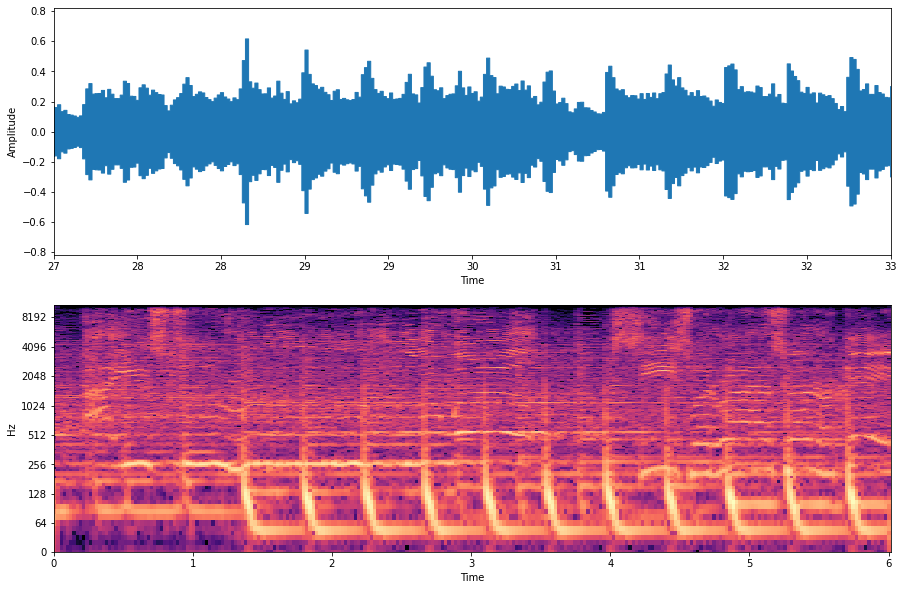

In [39]:
plt.figure(figsize=(15,10))

plt.subplot(2, 1, 1)
plt.ylabel('Amplitude')
plt.xlim(27,33)
librosa.display.waveshow(y, x_axis='time')

y, sr = librosa.load("Coldplay - Viva La Vida (Live In São Paulo)--ZvsGmYKhcU.wav", offset=27, duration=6)
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)

plt.subplot(2, 1, 2)
librosa.display.specshow(D, y_axis='log', x_axis='time', sr=sr)

### We can see that the amplitude of the first kick is slightly higher that 0.6.<br>
### So I will write an algorithm to locate the time of the first maximum sample which is higher than 0.6.<br>
### At the begining the crowd's noise is also very high in amplitude, so I will cut the begining off the song.

In [14]:
offset = 10
y, sr = librosa.load("Coldplay - Viva La Vida (Live In São Paulo)--ZvsGmYKhcU.wav", offset=offset)

In [24]:
#find the first sample with maximum amplitude which is higher than 0.6

frame_size = 512
max_amplitude = 0.
threshold = 0.6
y = abs(y)

# soft search -> search relevant frame (the max function is much faster than checking every sample)
for i in range(0, len(y), frame_size):
    if(max(y[i:i+frame_size]) > threshold):
        frame_start = i
        break
        
# hard search -> search relevant sample
for i in range(frame_start, (frame_start+frame_size)):
        if(y[i] > max_amplitude):
            max_amplitude = y[i]
            max_sample = i
            
print(max_amplitude)
print(max_sample)

0.6154574
405382


In [22]:
sample_duration = 1/sr
print(f'Sample duration: {sample_duration:f} second.')

Sample duration: 0.000045 second.


In [23]:
print(f'The exact time when the first drum hit is at {(sample_duration*max_sample) + offset:.6f} second.')

The exact time when the first drum hit is at 28.384671 second.
